In [276]:
import pandas as pd
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations
from collections import Counter

import seaborn as sns

In [290]:
df=pd.read_csv("test_urls.csv", index_col=0)

In [291]:
df.drop(["url","name","labels"],axis=1).sum()

Abstract           10652
Animal_Skins        1955
Animals/Birds       2765
Border               537
Camouflage          1949
Checks              1902
Conversationals     3559
Ethnic              3128
Floral             13596
Geometric          10727
Nature             11871
Paisleys             919
Placements           834
Stripes             2761
Texture             5833
Traditional         4901
Tribal              1442
Tropical            4832
dtype: int64

In [292]:
df=df[(df["Conversationals"]==0) & (df["Abstract"]==0) & (df["Animals/Birds"]==0)]

In [304]:
df_sub=df[(df["Nature"]==1) & (df["Tropical"]==1) & (df["Floral"]==0)].reset_index()

In [293]:
primary_cats=[]
for l in df.labels:
    labs=l.strip('][').replace("'","").split(', ')
    primary_cat=""
    for cat in ["Animal Skins","Checks","Stripes","Texture","Paisleys","Floral","Geometric"]:
        if labs[0]=="Floral" or labs[0]=="Geometric":
            parimary_cat=labs[0]
            break
        if cat in labs:
            primary_cat=cat
            
            break
    if primary_cat=="":
        primary_cat=labs[0]
    primary_cats.append(primary_cat)

In [294]:
Counter(primary_cats)

Counter({'Floral': 7962,
         'Geometric': 5251,
         'Paisleys': 219,
         'Texture': 307,
         'Animal Skins': 475,
         'Stripes': 221,
         'Tropical': 405,
         'Traditional': 74,
         'Ethnic': 139,
         'Checks': 110,
         'Nature': 63,
         'Camouflage': 12,
         'Border': 7,
         'Placements': 5,
         'Tribal': 6})

In [295]:
df["primary_cats"]=primary_cats

In [296]:
data_folder="fabrics"
from PIL import Image


In [297]:
df.columns

Index(['url', 'name', 'labels', 'Abstract', 'Animal_Skins', 'Animals/Birds',
       'Border', 'Camouflage', 'Checks', 'Conversationals', 'Ethnic', 'Floral',
       'Geometric', 'Nature', 'Paisleys', 'Placements', 'Stripes', 'Texture',
       'Traditional', 'Tribal', 'Tropical', 'primary_cats'],
      dtype='object')

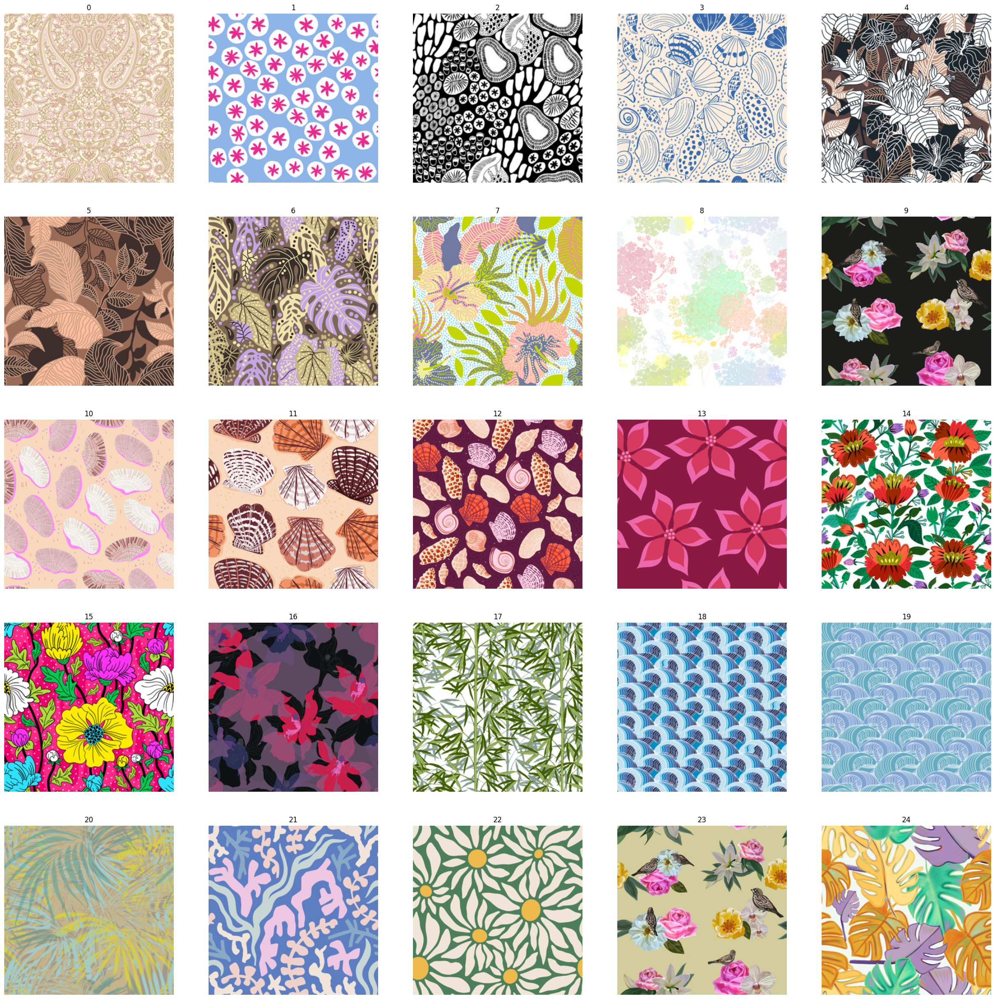

In [320]:
plt.figure(figsize=(30,30))
# df_sub=df[df["primary_cats"]=='Stripes'].reset_index()
df_sub=df[(df["Tropical"]==1)].reset_index()
files=df_sub.name.tolist()
x=0
for i,f in enumerate(files[x*25:x*25+25]):
    img = Image.open(data_folder+"/"+f).convert('RGB')
    plt.subplot(5,5,i+1)
    plt.imshow(img)
    plt.title(x*25+i)
    plt.axis("off")

In [319]:
df_sub.loc[198]

index                                                           2644
url                https://production-cdn1.patternbank.com/upload...
name               974276486-midnight-walk-floral-bright-blue-yel...
labels                                        ['Floral', 'Tropical']
Abstract                                                           0
Animal_Skins                                                       0
Animals/Birds                                                      0
Border                                                             0
Camouflage                                                         0
Checks                                                             0
Conversationals                                                    0
Ethnic                                                             0
Floral                                                             1
Geometric                                                          0
Nature                            

In [109]:
#checks
should_drop.append(df_sub.loc[[9,10,17,18,20]]["index"])
#abstract


In [ ]:
[146,147,282,302,304]

In [135]:
def update_primary_label(df,dropped_classes):
    primaries=[]
    new_labels=[]
    for l in df.labels:
        labs=l.strip('][').replace("'","").split(', ')
        try:
            nl=[i for i in labs if i not in dropped_classes]
            primaries.append(nl[0])
            new_labels.append("["+", ".join(nl)+"]")
        except:
            new_labels.append("[]")
            primaries.append("")
            
    df["primary_label"]=primaries
    df["labels"]=new_labels
    
    return df[df["primary_label"]!=""]

In [121]:
df=update_primary_label(df,[])

In [122]:
df=df[(df["Conversationals"]==0) & (df["Animals/Birds"]==0)  & (df["Ethnic"]==0)]

In [123]:
 # concepts rather than categories
dropped_classes=["Conversationals","Ethnic","Animals/Birds","Abstract"]
df=df.drop(dropped_classes,axis=1)
df=update_primary_label(df,dropped_classes)

In [124]:
df.groupby("primary_label").sum()

/tmp/ipykernel_33285/3319800987.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df.groupby("primary_label").sum()


,Animal_Skins,Border,Camouflage,Checks,Floral,Geometric,Nature,Paisleys,Placements,Stripes,Texture,Traditional,Tribal,Tropical
primary_label,,,,,,,,,,,,,,
Animal Skins,103,1,0,0,0,0,45,0,0,0,0,0,21,0
Border,0,9,0,0,0,0,0,0,0,0,0,0,0,0
Camouflage,223,1,358,0,0,0,98,0,0,0,0,0,12,0
Checks,2,1,1,147,0,0,6,2,5,36,54,31,2,3
Floral,111,106,281,55,9919,0,7363,327,254,192,916,2145,38,2722
Geometric,104,253,275,1569,1297,8202,515,69,336,1577,2325,1345,514,203
Nature,0,2,0,0,0,0,110,0,0,0,0,0,5,0
Paisleys,5,5,5,0,0,0,22,105,7,0,16,35,10,8
Placements,3,3,6,0,0,0,16,0,39,0,17,0,0,0


In [125]:
## primary tag of fewer than 50 images
dropped_classes=["Border","Placements","Tribal"]
df=df.drop(dropped_classes,axis=1)

df=update_primary_label(df,dropped_classes)

In [126]:
df[df["primary_label"]!=""]

,url,name,labels,Animal_Skins,Camouflage,Checks,Floral,Geometric,Nature,Paisleys,Stripes,Texture,Traditional,Tropical,primary_label
0,https://production-cdn2.patternbank.com/upload...,759293802-dark-palm-foliage.jpg,"[Tropical, Camouflage]",0,1,0,0,0,0,0,0,0,0,1,Tropical
1,https://production-cdn.patternbank.com/uploads...,546293798-simple-summer-flowers.jpg,"[Floral, Traditional, Nature]",0,0,0,1,0,1,0,0,0,1,0,Floral
2,https://production-cdn1.patternbank.com/upload...,753293788-abstact-animal-skin.jpg,"[Camouflage, Animal Skins]",1,1,0,0,0,0,0,0,0,0,0,Camouflage
5,https://production-cdn.patternbank.com/uploads...,587293784-monochrome-floral.jpg,"[Floral, Nature]",0,0,0,1,0,1,0,0,0,0,0,Floral
6,https://production-cdn.patternbank.com/uploads...,962293515-paisely-ogee.jpg,"[Paisleys, Tropical, Traditional]",0,0,0,0,0,0,1,0,0,1,1,Paisleys
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30513,https://production-cdn.patternbank.com/uploads...,57068227-spotted-ditsy-snake-skin-hexagons.jpg,"[Geometric, Nature]",0,0,0,0,1,1,0,0,0,0,0,Geometric
30514,https://production-cdn2.patternbank.com/upload...,63766007-foxy-watercolour.jpg,[Floral],0,0,0,1,0,0,0,0,0,0,0,Floral
30516,https://production-cdn2.patternbank.com/upload...,35568184-wondrous-nature.jpg,"[Floral, Nature]",0,0,0,1,0,1,0,0,0,0,0,Floral
30517,https://production-cdn.patternbank.com/uploads...,60067124-spotted-pastel-fun.jpg,[Geometric],0,0,0,0,1,0,0,0,0,0,0,Geometric


/tmp/ipykernel_33285/2592358471.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  plt.hist(list(df.drop(["url","name","labels"],axis=1).sum(axis=1)))


(array([ 2669.,     0.,     0., 11100.,     0.,     0.,  7916.,     0.,
            0.,    20.]),
 array([1. , 1.3, 1.6, 1.9, 2.2, 2.5, 2.8, 3.1, 3.4, 3.7, 4. ]),
 <BarContainer object of 10 artists>)

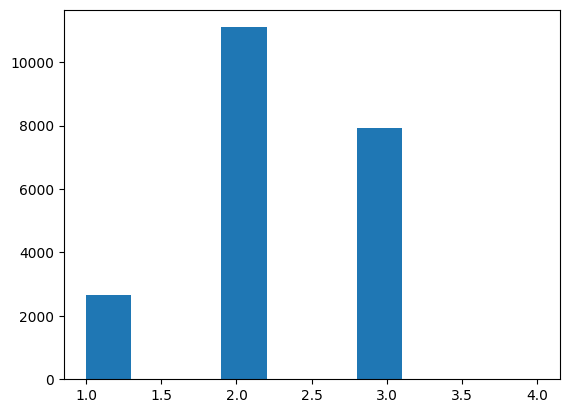

In [127]:
plt.hist(list(df.drop(["url","name","labels"],axis=1).sum(axis=1)))

In [54]:
df_feature_selection=df

In [55]:
df_primary_value_comparisons.columns

Index(['Abstract', 'Animals/Birds', 'Camouflage', 'Checks', 'Floral',
       'Geometric', 'Nature', 'Paisleys', 'Stripes', 'Texture'],
      dtype='object')

In [56]:
for i in range(3):
    df_primary_value_comparisons=df_feature_selection.groupby("primary_label").sum()
    better_label_count=(df_primary_value_comparisons>np.diag(df_primary_value_comparisons)).sum()
    dropping_class=better_label_count.index[better_label_count.argmax()]
    df_feature_selection=df_feature_selection.drop(dropping_class,axis=1)
    df_feature_selection=update_primary_label(df_feature_selection,dropping_class)
    # df_feature_election["primary_label"]=np.array([[i for i in l.strip('][').replace("'","").split(', ') if i not in dropped_classes] for l in df_feature_election.labels])
    print(i,dropping_class,len(df_feature_selection[df_feature_selection["primary_label"]!=""]))

/tmp/ipykernel_33285/2189793349.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_primary_value_comparisons=df_feature_selection.groupby("primary_label").sum()
/tmp/ipykernel_33285/2189793349.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_primary_value_comparisons=df_feature_selection.groupby("primary_label").sum()
/tmp/ipykernel_33285/2189793349.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_primary

0 Traditional 30136
1 Tropical 30023
2 Paisleys 29815


/tmp/ipykernel_33285/4273798848.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  plt.hist(list(df_feature_selection.drop(["url","name","labels"],axis=1).sum(axis=1)))


(array([5.3000e+01, 0.0000e+00, 5.7650e+03, 0.0000e+00, 1.5732e+04,
        0.0000e+00, 8.2340e+03, 0.0000e+00, 3.0000e+01, 1.0000e+00]),
 array([0. , 0.5, 1. , 1.5, 2. , 2.5, 3. , 3.5, 4. , 4.5, 5. ]),
 <BarContainer object of 10 artists>)

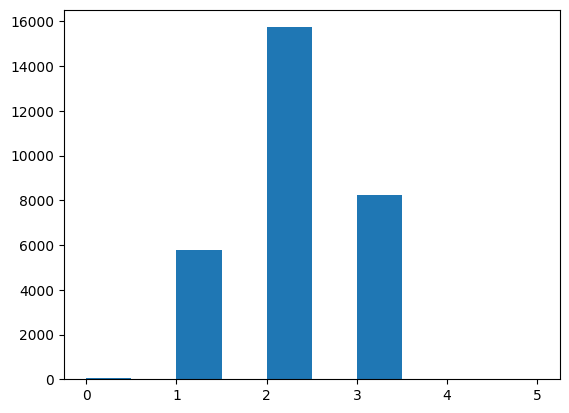

In [57]:
plt.hist(list(df_feature_selection.drop(["url","name","labels"],axis=1).sum(axis=1)))

In [58]:
df_feature_selection

,url,name,labels,Abstract,Animals/Birds,Camouflage,Checks,Floral,Geometric,Nature,Stripes,Texture,primary_label
0,https://production-cdn2.patternbank.com/upload...,759293802-dark-palm-foliage.jpg,"[Abstract, Camouflage]",1,0,1,0,0,0,0,0,0,Abstract
1,https://production-cdn.patternbank.com/uploads...,546293798-simple-summer-flowers.jpg,"[Floral, Nature]",0,0,0,0,1,0,1,0,0,Floral
2,https://production-cdn1.patternbank.com/upload...,753293788-abstact-animal-skin.jpg,"[Abstract, Camouflage, Animal Skins]",1,0,1,0,0,0,0,0,0,Abstract
3,https://production-cdn1.patternbank.com/upload...,901293790-want-23-hand-drawn-vector-waves-on-g...,[Geometric],0,0,0,0,0,1,0,0,0,Geometric
4,https://production-cdn2.patternbank.com/upload...,157293787-abstract-black-stones.jpg,"[Abstract, Nature]",1,0,0,0,0,0,1,0,0,Abstract
...,...,...,...,...,...,...,...,...,...,...,...,...,...
30514,https://production-cdn2.patternbank.com/upload...,63766007-foxy-watercolour.jpg,[Floral],0,0,0,0,1,0,0,0,0,Floral
30516,https://production-cdn2.patternbank.com/upload...,35568184-wondrous-nature.jpg,"[Floral, Nature]",0,0,0,0,1,0,1,0,0,Floral
30517,https://production-cdn.patternbank.com/uploads...,60067124-spotted-pastel-fun.jpg,"[Geometric, Abstract]",1,0,0,0,0,1,0,0,0,Geometric
30518,https://production-cdn2.patternbank.com/upload...,56764039-tribal-geo.jpg,[Geometric],0,0,0,0,0,1,0,0,0,Geometric


/tmp/ipykernel_33285/1488760400.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_feature_selection.groupby("primary_label").sum().T


primary_label,Abstract,Animal Skins,Animals/Birds,Camouflage,Checks,Floral,Geometric,Nature,Stripes,Texture
Abstract,2925,0,255,0,0,2730,4742,0,0,0
Animals/Birds,0,0,1850,0,0,757,158,0,0,0
Camouflage,794,0,73,241,0,292,297,0,47,205
Checks,55,0,12,0,120,57,1658,0,0,0
Floral,0,0,0,0,0,12093,1503,0,0,0
Geometric,0,0,0,0,0,0,10727,0,0,0
Nature,603,46,1006,157,7,8386,624,753,42,247
Stripes,379,0,41,0,32,207,1752,0,350,0
Texture,1395,0,194,0,30,956,2513,0,88,657


/tmp/ipykernel_33285/4010624257.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  sns.heatmap(df_feature_selection.groupby("primary_label").sum().T)


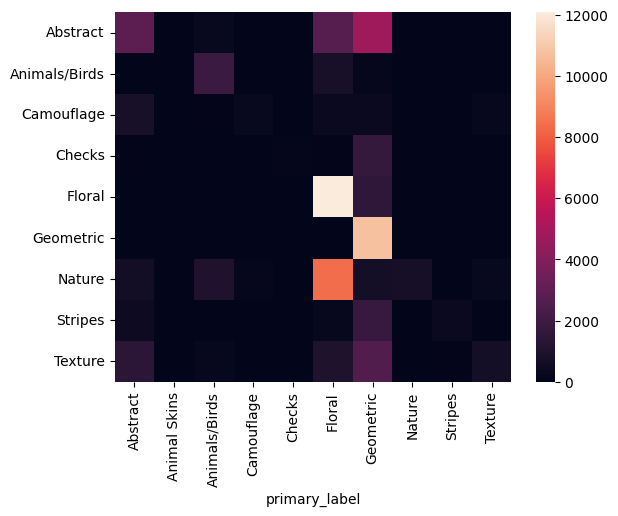

In [66]:

sns.heatmap(df_feature_selection.groupby("primary_label").sum().T)
plt.show()

In [96]:
df.drop(["url","name","labels"],axis=1)

,Abstract,Animal_Skins,Animals/Birds,Border,Camouflage,Checks,Conversationals,Ethnic,Floral,Geometric,Nature,Paisleys,Placements,Stripes,Texture,Traditional,Tribal,Tropical,primary_label
0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,Abstract
1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,Floral
2,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,Abstract
3,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,Geometric
4,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,Conversationals
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30515,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,Conversationals
30516,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,Floral
30517,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,Geometric
30518,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,Geometric


In [40]:
classes=sorted(list(df.drop(["url","name","labels"],axis=1).columns))

In [41]:
relations=[]
for a,b in combinations(classes,2):
    relations.append({"source":a,"target":b,"weight":len(df[(df[a]==1) & (df[b]==1)])})

In [42]:
df_r=pd.DataFrame.from_records(relations)

In [109]:
matrix=[[0]*len(classes) for i in range(len(classes))]
for a in range(len(classes)):
    for b in range(a,len(classes)):
        matrix[a][b]=matrix[b][a]=len(df[(df[classes[a]]==1) & (df[classes[b]]==1)])

In [113]:
df_m=pd.DataFrame(matrix,index=classes,columns=classes)

In [114]:
df_m

,Abstract,Animal_Skins,Animals/Birds,Border,Camouflage,Checks,Conversationals,Ethnic,Floral,Geometric,Nature,Paisleys,Placements,Stripes,Texture,Traditional,Tribal,Tropical
Abstract,10652,775,304,56,1071,604,851,713,3036,4742,2246,135,126,970,2947,656,301,652
Animal_Skins,775,1955,630,4,497,10,82,117,135,125,347,6,3,143,654,26,83,158
Animals/Birds,304,630,2765,10,81,12,578,103,766,158,1408,9,44,46,208,233,45,615
Border,56,4,10,537,4,60,27,99,163,278,72,56,18,76,39,59,22,7
Camouflage,1071,497,81,4,1949,9,62,101,297,297,380,6,16,93,621,40,23,211
Checks,604,10,12,60,9,1902,40,81,105,1658,43,7,63,300,289,247,66,13
Conversationals,851,82,578,27,62,40,3559,90,834,937,1259,27,103,171,405,360,38,408
Ethnic,713,117,103,99,101,81,90,3128,847,1494,315,376,38,212,270,466,677,123
Floral,3036,135,766,163,297,105,834,847,13596,1503,8623,495,293,253,1022,2735,70,3053
Geometric,4742,125,158,278,297,1658,937,1494,1503,10727,624,98,372,1752,2513,1596,1039,254


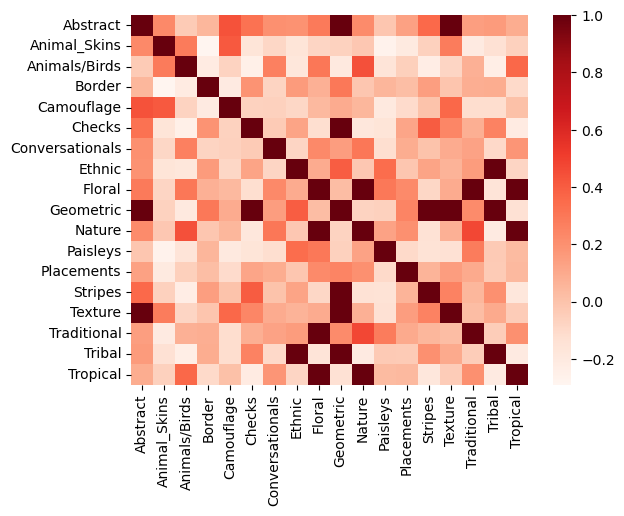

In [122]:
import seaborn as sns

cor=df_m.corr()
cor[cor>0.5]=1
sns.heatmap(cor, cmap=plt.cm.Reds)
plt.show()

In [45]:
from d3blocks import D3Blocks
d3 = D3Blocks()
d3.chord(df_r)
d3.show(notebook=True,filepath="/bi/ala/scratch/pmehrbod/GAN/test_chord.html")

[d3blocks] >INFO> Cleaning edge_properties and config parameters..
[d3blocks] >INFO> Cleaning edge_properties and config parameters..
[d3blocks] >INFO> Initializing [Chord]
[d3blocks] >INFO> filepath is set to [/tmp/d3blocks/chord.html]
[d3blocks] >INFO> Convert to Frame.
[d3blocks] >INFO> Node properties are set.
[d3blocks] >INFO> Set edge-opacity based on the [source] node-opacity.
[d3blocks] >INFO> Set edge-colors based on the [source] node-color.
[d3blocks] >INFO> Edge properties are set.
[d3blocks] >INFO> File already exists and will be overwritten: [/tmp/d3blocks/chord.html]
[d3blocks] >INFO> Open browser: /tmp/d3blocks/chord.html
[d3blocks] >INFO> Set [notebook]: True
[d3blocks] >INFO> Set [filepath]: /bi/ala/scratch/pmehrbod/GAN/test_chord.html
[d3blocks] >INFO> File already exists and will be overwritten: [/bi/ala/scratch/pmehrbod/GAN/test_chord.html]


>4;1H84l=                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

[d3blocks] >INFO> Display in notebook using IPython.


In [67]:
classes

['Abstract',
 'Animal_Skins',
 'Animals/Birds',
 'Border',
 'Camouflage',
 'Checks',
 'Conversationals',
 'Ethnic',
 'Floral',
 'Geometric',
 'Nature',
 'Paisleys',
 'Placements',
 'Stripes',
 'Texture',
 'Traditional',
 'Tribal',
 'Tropical']

In [69]:
new_classes=set(classes).difference(set(['Animals/Birds', 'Border', 'Camouflage','Nature','Traditional','Abstract',"Conversationals","Ethnic"]))

In [87]:
new_classes=['Checks',
 'Floral',
 # 'Geometric',
 'Stripes',
'Texture']

In [88]:
new_classes

['Checks', 'Floral', 'Stripes', 'Texture']

In [89]:
df_subset=df[df[new_classes].sum(axis=1)>0].reset_index()

In [91]:
relations_subset=[]
for a,b in combinations(new_classes,2):
    relations_subset.append({"source":a,"target":b,"weight":len(df_subset[(df_subset[a]==1) & (df_subset[b]==1)])})

In [92]:
df_r=pd.DataFrame.from_records(relations_subset)

In [93]:
d3.chord(df_r)
d3.show(filepath="/bi/ala/scratch/pmehrbod/GAN/test_chord_subset.html")

[d3blocks] >INFO> Cleaning edge_properties and config parameters..
[d3blocks] >INFO> Initializing [Chord]
[d3blocks] >INFO> filepath is set to [/tmp/d3blocks/chord.html]
[d3blocks] >INFO> Convert to Frame.
[d3blocks] >INFO> Node properties are set.
[d3blocks] >INFO> Set edge-opacity based on the [source] node-opacity.
[d3blocks] >INFO> Set edge-colors based on the [source] node-color.
[d3blocks] >INFO> Edge properties are set.
[d3blocks] >INFO> File already exists and will be overwritten: [/tmp/d3blocks/chord.html]
[d3blocks] >INFO> Open browser: /tmp/d3blocks/chord.html
[d3blocks] >INFO> Set [filepath]: /bi/ala/scratch/pmehrbod/GAN/test_chord_subset.html
[d3blocks] >INFO> File already exists and will be overwritten: [/bi/ala/scratch/pmehrbod/GAN/test_chord_subset.html]


>4;1H84l=                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

[d3blocks] >INFO> Open browser: /bi/ala/scratch/pmehrbod/GAN/test_chord_subset.html


>4;1H84l=                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            